In [1]:
# Install all the required libraries
!pip install pandas numpy matplotlib seaborn plotly scikit-learn statsmodels jupyter-dash keras tensorflow

# Import necessary libraries
from dash import Dash, dcc, html, Input, Output
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing


In [2]:
# Load the datasets
card_access_group_df = pd.read_csv('/Users/roheetbakare/Downloads/Data Practice/CardAccessGroupAssignment.csv')
card_transaction_df = pd.read_csv('/Users/roheetbakare/Downloads/Data Practice/CardTransaction.csv')

# Convert datetime fields to datetime objects
card_transaction_df['EntranceTime'] = pd.to_datetime(card_transaction_df['EntranceTime'], errors='coerce')
card_transaction_df['ExitTime'] = pd.to_datetime(card_transaction_df['ExitTime'], errors='coerce')


In [3]:
# Display data types for each dataset
print("Card Access Group Assignment Data Types:")
print(card_access_group_df.dtypes)

print("\nCard Transaction Data Types:")
print(card_transaction_df.dtypes)

# Summary information for each dataset
print("\nCard Access Group Assignment Info:")
print(card_access_group_df.info())

print("\nCard Transaction Info:")
print(card_transaction_df.info())

# Additional: Identifying specific types of columns
# Numeric columns
numeric_columns = card_transaction_df.select_dtypes(include=['number']).columns
print("\nNumeric Columns in CardTransaction Dataset:", numeric_columns)

# Categorical columns
categorical_columns = card_transaction_df.select_dtypes(include=['object']).columns
print("\nCategorical Columns in CardTransaction Dataset:", categorical_columns)

# Datetime columns
datetime_columns = card_transaction_df.select_dtypes(include=['datetime']).columns
print("\nDatetime Columns in CardTransaction Dataset:", datetime_columns)


Card Access Group Assignment Data Types:
CardNumber     int64
Priority       int64
GroupNumber    int64
dtype: object

Card Transaction Data Types:
TransactionId                    int64
CardNumber                       int64
LotNumber                        int64
NoEntry                          int64
NoExit                           int64
Overnight                        int64
EntranceTime            datetime64[ns]
ExitTime                datetime64[ns]
EffectiveGroupNumber             int64
dtype: object

Card Access Group Assignment Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21545 entries, 0 to 21544
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   CardNumber   21545 non-null  int64
 1   Priority     21545 non-null  int64
 2   GroupNumber  21545 non-null  int64
dtypes: int64(3)
memory usage: 505.1 KB
None

Card Transaction Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2882206 entries, 0 to 28

In [4]:
card_transaction_df = pd.merge(card_access_group_df, card_transaction_df, how="right", on="CardNumber")

In [5]:
card_transaction_df = card_transaction_df.sort_values('EntranceTime')
card_transaction_df.sample(10)

,CardNumber,Priority,GroupNumber,TransactionId,LotNumber,NoEntry,NoExit,Overnight,EntranceTime,ExitTime,EffectiveGroupNumber
4528613,10969,2.0,81.0,29553945,3,0,0,0,2024-10-04 10:34:02.630000000,2024-10-04 14:01:54.170000000,47
4373874,9753,1.0,33.0,29333753,24,0,0,0,2024-09-09 13:08:51.123000000,2024-09-09 15:26:11.703000000,33
621199,25076,2.0,81.0,20905219,80,0,0,0,2021-11-11 08:34:49.610000000,2021-11-11 08:41:40.270000000,81
3564182,1674,1.0,7.0,28008505,11,0,0,0,2024-03-21 17:25:15.116666700,2024-03-21 18:56:31.096666700,85
2298381,52875,1.0,81.0,25492585,6,0,0,1,2023-05-20 14:03:49.796666700,2023-05-21 02:09:27.386666700,81
361326,55659,3.0,81.0,19959657,20,0,0,0,2021-07-29 07:00:50.076666700,2021-07-29 16:08:14.913333300,27
1422716,65304,2.0,81.0,23350685,11,0,0,0,2022-09-15 08:38:33.263333300,2022-09-15 12:05:11.036666700,72
2498894,63038,2.0,81.0,25921435,11,0,0,0,2023-07-20 07:16:28.093333300,2023-07-20 15:00:08.583333300,72
487846,45676,2.0,81.0,20427519,11,0,0,0,2021-09-21 05:59:09.983333300,2021-09-21 11:23:25.020000000,72
1385144,52590,1.0,7.0,23252544,80,0,0,0,2022-09-02 19:48:00.063333300,2022-09-02 19:49:31.656666700,76


In [6]:
card_transaction_df.drop("TransactionId", inplace=True, axis=1)

In [7]:
card_transaction_df[(card_transaction_df['NoEntry'] == 1) | (card_transaction_df['NoExit'] == 1)].sample(10)


,CardNumber,Priority,GroupNumber,LotNumber,NoEntry,NoExit,Overnight,EntranceTime,ExitTime,EffectiveGroupNumber
80202,23598,2.0,81.0,40,0,1,0,2021-02-17 08:03:01.000000000,NaT,39
3849006,59286,1.0,39.0,40,0,1,0,2024-05-14 08:28:32.990000000,NaT,39
3704415,40029,1.0,24.0,21,0,1,0,2024-04-16 07:39:51.917000000,NaT,24
3142931,17596,2.0,81.0,40,1,0,0,NaT,2023-12-15 14:21:57.173333300,39
1082316,54555,1.0,39.0,40,0,1,0,2022-05-10 13:18:21.746666700,NaT,39
226174,19602,1.0,39.0,40,0,1,0,2021-05-06 08:12:50.000000000,NaT,39
3194905,13644,1.0,47.0,3,1,0,0,NaT,2024-01-02 16:34:38.453333300,47
3888013,63054,2.0,81.0,40,1,0,0,NaT,2024-05-24 16:04:05.790000000,39
2116481,34016,2.0,81.0,51,0,1,0,2023-04-03 08:10:48.853333300,NaT,26
3360135,18214,2.0,81.0,40,0,1,0,2024-02-08 07:57:13.620000000,NaT,39


In [8]:
# Replace NaT in EntranceTime with midnight of ExitTime day
card_transaction_df['EntranceTime'] = np.where(
    card_transaction_df['EntranceTime'].isna(),
    pd.to_datetime(card_transaction_df['ExitTime']).dt.normalize(),
    card_transaction_df['EntranceTime']
)

# Replace NaT in ExitTime with 11:59 PM of EntranceTime day
card_transaction_df['ExitTime'] = np.where(
    card_transaction_df['ExitTime'].isna(),
    pd.to_datetime(card_transaction_df['EntranceTime']).dt.normalize() + pd.Timedelta(hours=23, minutes=59),
    card_transaction_df['ExitTime']
)

# Ensure the columns are in datetime format after replacement
card_transaction_df['EntranceTime'] = pd.to_datetime(card_transaction_df['EntranceTime'], errors='coerce')
card_transaction_df['ExitTime'] = pd.to_datetime(card_transaction_df['ExitTime'], errors='coerce')

# Display the updated DataFrame
print(card_transaction_df.head())


        CardNumber  Priority  GroupNumber  LotNumber  NoEntry  NoExit  \
76693        42239       1.0         26.0         51        0       0   
76694        42239       2.0         81.0         51        0       0   
54513        29065       1.0         39.0         40        0       0   
54514        29065       2.0         81.0         40        0       0   
215679       50337       1.0         39.0         40        0       0   

        Overnight        EntranceTime            ExitTime  \
76693           1 2020-12-18 07:31:50 2021-02-17 16:01:23   
76694           1 2020-12-18 07:31:50 2021-02-17 16:01:23   
54513           1 2020-12-21 08:23:57 2021-02-04 14:49:35   
54514           1 2020-12-21 08:23:57 2021-02-04 14:49:35   
215679          1 2020-12-21 15:11:31 2021-05-04 13:14:16   

        EffectiveGroupNumber  
76693                     26  
76694                     26  
54513                     39  
54514                     39  
215679                    39  


In [9]:
card_transaction_df[(card_transaction_df['NoEntry'] == 1) | (card_transaction_df['NoExit'] == 1)].sample(10)


,CardNumber,Priority,GroupNumber,LotNumber,NoEntry,NoExit,Overnight,EntranceTime,ExitTime,EffectiveGroupNumber
4665130,58122,1.0,39.0,40,0,1,0,2024-10-24 08:44:12.383000000,2024-10-24 23:59:00.000000000,39
4246084,53437,2.0,39.0,40,0,1,0,2024-08-14 07:39:46.843000000,2024-08-14 23:59:00.000000000,39
448158,61690,1.0,24.0,21,0,1,0,2021-09-07 07:25:58.710000000,2021-09-07 23:59:00.000000000,24
1230294,20494,1.0,26.0,51,0,1,0,2022-07-14 12:55:53.336666700,2022-07-14 23:59:00.000000000,26
4059656,54937,2.0,81.0,40,0,1,0,2024-07-02 12:53:22.327000000,2024-07-02 23:59:00.000000000,39
4298483,60840,2.0,81.0,18,0,1,0,2024-08-22 11:20:47.043000000,2024-08-22 23:59:00.000000000,32
2446264,17416,1.0,39.0,40,1,0,0,2023-07-05 00:00:00.000000000,2023-07-05 16:05:09.733333300,39
3044440,18506,2.0,81.0,70,0,1,0,2023-11-21 20:33:29.406666700,2023-11-21 23:59:00.000000000,81
4596979,57236,1.0,39.0,40,0,1,0,2024-10-15 14:22:20.517000000,2024-10-15 23:59:00.000000000,39
1893742,53233,1.0,24.0,21,0,1,0,2023-02-02 10:11:24.396666700,2023-02-02 23:59:00.000000000,24


In [10]:
# Check for null values in the dataset
null_counts = card_transaction_df.isnull().sum()

# Display null counts
print("Null values in each column:")
print(null_counts)


Null values in each column:
CardNumber                 0
Priority                1782
GroupNumber             1782
LotNumber                  0
NoEntry                    0
NoExit                     0
Overnight                  0
EntranceTime               0
ExitTime                   0
EffectiveGroupNumber       0
dtype: int64


In [11]:
card_transaction_df.dropna(inplace=True)

In [12]:
# Check for null values in the dataset
null_counts = card_transaction_df.isnull().sum()

# Display null counts
print("Null values in each column:")
print(null_counts)


Null values in each column:
CardNumber              0
Priority                0
GroupNumber             0
LotNumber               0
NoEntry                 0
NoExit                  0
Overnight               0
EntranceTime            0
ExitTime                0
EffectiveGroupNumber    0
dtype: int64


In [13]:
# Extract unique dates from EntranceTime
unique_dates = card_transaction_df['EntranceTime'].dropna().dt.date.unique()

# Create a new DataFrame with unique dates and peak usage set to zero
peak_usage_df = pd.DataFrame({
    'Date': unique_dates,
    'PeakCars': 0
})

# Display the new DataFrame
print(peak_usage_df.head())

card_transaction_df = card_transaction_df.sort_values('EntranceTime')
card_transaction_df.head()

         Date  PeakCars
0  2020-12-18         0
1  2020-12-21         0
2  2020-12-26         0
3  2020-12-28         0
4  2020-12-29         0


,CardNumber,Priority,GroupNumber,LotNumber,NoEntry,NoExit,Overnight,EntranceTime,ExitTime,EffectiveGroupNumber
76693,42239,1.0,26.0,51,0,0,1,2020-12-18 07:31:50,2021-02-17 16:01:23,26
76694,42239,2.0,81.0,51,0,0,1,2020-12-18 07:31:50,2021-02-17 16:01:23,26
54513,29065,1.0,39.0,40,0,0,1,2020-12-21 08:23:57,2021-02-04 14:49:35,39
54514,29065,2.0,81.0,40,0,0,1,2020-12-21 08:23:57,2021-02-04 14:49:35,39
215679,50337,1.0,39.0,40,0,0,1,2020-12-21 15:11:31,2021-05-04 13:14:16,39


In [14]:
def calculate_peak_usage(data):
    
    # Ensure datetime format for EntranceTime and ExitTime
    data['EntranceTime'] = pd.to_datetime(data['EntranceTime'])
    data['ExitTime'] = pd.to_datetime(data['ExitTime'])

    # Extract date and hour for Entrance and Exit
    data['EntranceDate'] = data['EntranceTime'].dt.date
    data['ExitDate'] = data['ExitTime'].dt.date

    # Placeholder for hourly usage calculation
    hourly_usage = []

    # Process each parking lot separately
    for lot in data['LotNumber'].unique():
        lot_data = data[data['LotNumber'] == lot]

        # Create a date range covering all possible dates
        min_date = lot_data['EntranceTime'].min().date()
        max_date = lot_data['ExitTime'].max().date()

        for current_date in pd.date_range(start=min_date, end=max_date):
            # Filter transactions active on the current day
            daily_data = lot_data[
                (lot_data['EntranceTime'].dt.date <= current_date.date()) &
                (lot_data['ExitTime'].dt.date >= current_date.date())
            ]

            # Generate hourly ranges for the current day
            hourly_range = pd.date_range(
                start=pd.Timestamp(current_date),
                end=pd.Timestamp(current_date) + pd.Timedelta(hours=23),
                freq='H'
            )

            # Count active cars for each hour
            for hour in hourly_range:
                active_cars = daily_data[
                    (daily_data['EntranceTime'] <= hour) &
                    (daily_data['ExitTime'] > hour)
                ].shape[0]
                hourly_usage.append({
                    'LotNumber': lot,
                    'Date': current_date.date(),
                    'Hour': hour,
                    'ActiveCars': active_cars
                })

    # Convert hourly usage to a DataFrame
    hourly_usage_df = pd.DataFrame(hourly_usage)

    # Calculate daily peak usage
    daily_peak = (
        hourly_usage_df.groupby(['LotNumber', 'Date'])
        .agg({'ActiveCars': 'max'})
        .reset_index()
        .rename(columns={'ActiveCars': 'DailyPeak'})
    )

    # Add week and month to the daily peak DataFrame
    daily_peak['Week'] = pd.to_datetime(daily_peak['Date']).dt.isocalendar().week
    daily_peak['Month'] = pd.to_datetime(daily_peak['Date']).dt.month

    # Calculate weekly peak usage
    weekly_peak = (
        daily_peak.groupby(['LotNumber', 'Week'])
        .agg({'DailyPeak': 'max'})
        .reset_index()
        .rename(columns={'DailyPeak': 'WeeklyPeak'})
    )

    # Calculate monthly peak usage
    monthly_peak = (
        daily_peak.groupby(['LotNumber', 'Month'])
        .agg({'DailyPeak': 'max'})
        .reset_index()
        .rename(columns={'DailyPeak': 'MonthlyPeak'})
    )

    return {
        'hourly_usage': hourly_usage_df,
        'daily_peak': daily_peak,
        'weekly_peak': weekly_peak,
        'monthly_peak': monthly_peak
    }


peak_usage = calculate_peak_usage(card_transaction_df)

print("Hourly Usage:")
print(peak_usage['hourly_usage'].sample(15))

print("\nDaily Peak Usage:")
print(peak_usage['daily_peak'].sample(15))

print("\nWeekly Peak Usage:")
print(peak_usage['weekly_peak'].sample(15))

print("\nMonthly Peak Usage:")
print(peak_usage['monthly_peak'].sample(15))


/var/folders/2j/9ww_q3ds0qz2_rj9cjylkwrm0000gn/T/ipykernel_24219/4132005827.py:30: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_range = pd.date_range(


Hourly Usage:
        LotNumber        Date                Hour  ActiveCars
400435         20  2024-06-04 2024-06-04 19:00:00          10
563774         24  2023-12-03 2023-12-03 14:00:00          12
451226          3  2022-07-24 2022-07-24 02:00:00           7
373918         20  2021-05-26 2021-05-26 22:00:00           2
443820          3  2021-09-18 2021-09-18 12:00:00           0
495046         33  2023-09-24 2023-09-24 22:00:00           1
100125         80  2024-09-02 2024-09-02 21:00:00          69
623320         14  2023-01-24 2023-01-24 16:00:00          45
213969         21  2022-04-22 2022-04-22 09:00:00          31
382012         20  2022-04-29 2022-04-29 04:00:00           3
756678         99  2022-12-24 2022-12-24 06:00:00           0
731587          8  2023-12-10 2023-12-10 19:00:00           2
476696         33  2021-08-21 2021-08-21 08:00:00           1
364324         13  2024-02-20 2024-02-20 04:00:00           4
689219         34  2022-12-07 2022-12-07 11:00:00       

In [15]:
# Extract the DataFrames from the dictionary
hourly_usage_df = peak_usage["hourly_usage"]
daily_peak_df = peak_usage["daily_peak"]
weekly_peak_df = peak_usage["weekly_peak"]
monthly_peak_df = peak_usage["monthly_peak"]


In [16]:
# Display the first few rows of each DataFrame to ensure they're correctly created
print("Hourly Usage DataFrame:")
print(hourly_usage_df.head())

print("\nDaily Peak DataFrame:")
print(daily_peak_df.head())

print("\nWeekly Peak DataFrame:")
print(weekly_peak_df.head())

print("\nMonthly Peak DataFrame:")
print(monthly_peak_df.head())


Hourly Usage DataFrame:
   LotNumber        Date                Hour  ActiveCars
0         51  2020-12-18 2020-12-18 00:00:00           0
1         51  2020-12-18 2020-12-18 01:00:00           0
2         51  2020-12-18 2020-12-18 02:00:00           0
3         51  2020-12-18 2020-12-18 03:00:00           0
4         51  2020-12-18 2020-12-18 04:00:00           0

Daily Peak DataFrame:
   LotNumber        Date  DailyPeak  Week  Month
0          3  2021-01-02          0    53      1
1          3  2021-01-03          2    53      1
2          3  2021-01-04         29     1      1
3          3  2021-01-05         28     1      1
4          3  2021-01-06         39     1      1

Weekly Peak DataFrame:
   LotNumber  Week  WeeklyPeak
0          3     1         145
1          3     2         175
2          3     3         243
3          3     4         296
4          3     5         317

Monthly Peak DataFrame:
   LotNumber  Month  MonthlyPeak
0          3      1          317
1          3    

In [17]:
parking_data = pd.DataFrame(card_transaction_df)

# Calculate hourly usage for each lot
def calculate_peak_periods(df):
    hourly_data = []
    for lot in df['LotNumber'].unique():
        lot_data = df[df['LotNumber'] == lot]
        for date in pd.date_range(start=lot_data['EntranceTime'].min(), end=lot_data['ExitTime'].max(), freq='D'):
            hourly_usage = []
            for hour in pd.date_range(start=date, periods=24, freq='h'):
                simultaneous_usage = lot_data[
                    (lot_data['EntranceTime'] <= hour) & 
                    (lot_data['ExitTime'] > hour)
                ].shape[0]
                hourly_usage.append({
                    'LotNumber': lot,
                    'Date': date.date(),
                    'Hour': hour.hour,
                    'SimultaneousUsage': simultaneous_usage
                })
            # Find peak for the day
            peak_hour = max(hourly_usage, key=lambda x: x['SimultaneousUsage'])
            hourly_data.append(peak_hour)
    hourly_df = pd.DataFrame(hourly_data)
    
    # Calculate weekly and monthly peaks
    hourly_df['Week'] = pd.to_datetime(hourly_df['Date']).dt.isocalendar().week
    hourly_df['Month'] = pd.to_datetime(hourly_df['Date']).dt.month

    weekly_peak = (
        hourly_df.groupby(['LotNumber', 'Week'], as_index=False)
        .agg({'SimultaneousUsage': 'max'})
        .rename(columns={'SimultaneousUsage': 'WeeklyPeak'})
    )

    monthly_peak = (
        hourly_df.groupby(['LotNumber', 'Month'], as_index=False)
        .agg({'SimultaneousUsage': 'max'})
        .rename(columns={'SimultaneousUsage': 'MonthlyPeak'})
    )
    return hourly_df, weekly_peak, monthly_peak

# Calculate peak periods
daily_peak, weekly_peak, monthly_peak = calculate_peak_periods(parking_data)

# Initialize Dash app
app = Dash(__name__)

# Layout
app.layout = html.Div([
    html.H1("Parking Lot Peak Usage Dashboard", style={'textAlign': 'center'}),
    
    html.Div([
        html.Label("Select Parking Lot:"),
        dcc.Dropdown(
            id='lot-selector',
            options=[{'label': f'Lot {lot}', 'value': lot} for lot in parking_data['LotNumber'].unique()],
            value=parking_data['LotNumber'].unique()[0],
            clearable=False
        )
    ], style={'margin': '20px'}),
    
    html.Div([
        html.Label("Select Date Range:"),
        dcc.DatePickerRange(
            id='date-range-picker',
            start_date=str(parking_data['EntranceTime'].dt.date.min()),
            end_date=str(parking_data['EntranceTime'].dt.date.max()),
            display_format='YYYY-MM-DD'
        )
    ], style={'margin': '20px'}),
    
    html.Div([
        html.Label("Select Time Period:"),
        dcc.Dropdown(
            id='time-period-selector',
            options=[
                {'label': 'Daily Peak', 'value': 'daily'},
                {'label': 'Weekly Peak', 'value': 'weekly'},
                {'label': 'Monthly Peak', 'value': 'monthly'}
            ],
            value='daily',
            clearable=False
        )
    ], style={'margin': '20px'}),
    
    dcc.Graph(id='peak-usage-chart')
])

# Callback to update the graph
@app.callback(
    Output('peak-usage-chart', 'figure'),
    [Input('lot-selector', 'value'),
     Input('date-range-picker', 'start_date'),
     Input('date-range-picker', 'end_date'),
     Input('time-period-selector', 'value')]
)
def update_chart(lot, start_date, end_date, time_period):
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)

    if time_period == 'daily':
        filtered_data = daily_peak[
            (daily_peak['LotNumber'] == lot) &
            (daily_peak['Date'] >= start_date.date()) &
            (daily_peak['Date'] <= end_date.date())
        ]
        fig = px.bar(
            filtered_data, x='Date', y='SimultaneousUsage', 
            title=f'Daily Peak Usage for Lot {lot}',
            labels={'SimultaneousUsage': 'Peak Cars', 'Date': 'Date'},
            hover_data={'Hour': True}
        )
    elif time_period == 'weekly':
        filtered_data = weekly_peak[
            (weekly_peak['LotNumber'] == lot) &
            (weekly_peak['Week'] >= start_date.isocalendar().week) &
            (weekly_peak['Week'] <= end_date.isocalendar().week)
        ]
        fig = px.bar(
            filtered_data, x='Week', y='WeeklyPeak', 
            title=f'Weekly Peak Usage for Lot {lot}',
            labels={'WeeklyPeak': 'Peak Cars', 'Week': 'Week Number'}
        )
    elif time_period == 'monthly':
        filtered_data = monthly_peak[
            (monthly_peak['LotNumber'] == lot) &
            (monthly_peak['Month'] >= start_date.month) &
            (monthly_peak['Month'] <= end_date.month)
        ]
        fig = px.bar(
            filtered_data, x='Month', y='MonthlyPeak', 
            title=f'Monthly Peak Usage for Lot {lot}',
            labels={'MonthlyPeak': 'Peak Cars', 'Month': 'Month'}
        )
    return fig

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True, port= 3000)


In [18]:
# Calculate relative usage
daily_peak_df['RelativeUsage'] = daily_peak_df.groupby('LotNumber')['DailyPeak'].transform(
    lambda x: x / x.max()
)

# Visualization for relative usage
import plotly.express as px

fig = px.line(daily_peak_df, x='Date', y='RelativeUsage', color='LotNumber',
              title="Relative Peak Usage by Lot (Normalized to Maximum Usage)")
fig.show()


In [19]:
# Determine the 90th percentile threshold for high usage per lot
daily_peak_df['HighTraffic'] = daily_peak_df.groupby('LotNumber')['DailyPeak'].transform(
    lambda x: x > x.quantile(0.90)
)

# Filter high-traffic dates
high_traffic_df = daily_peak_df[daily_peak_df['HighTraffic']]

# Save high-traffic data
high_traffic_df.to_csv("HighTrafficDates.csv", index=False)


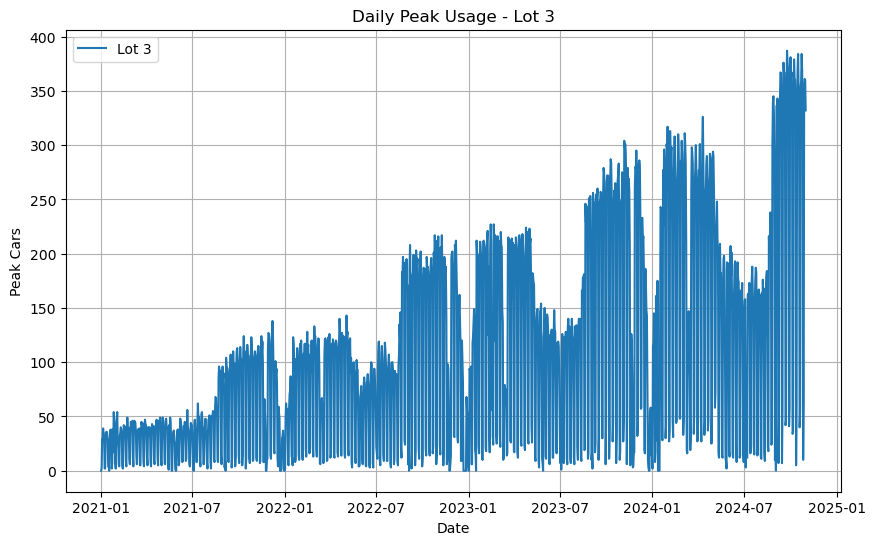

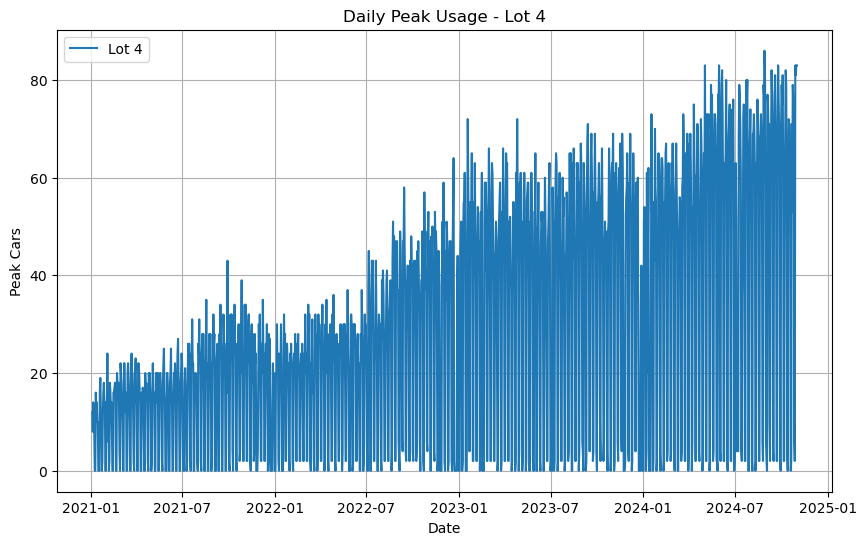

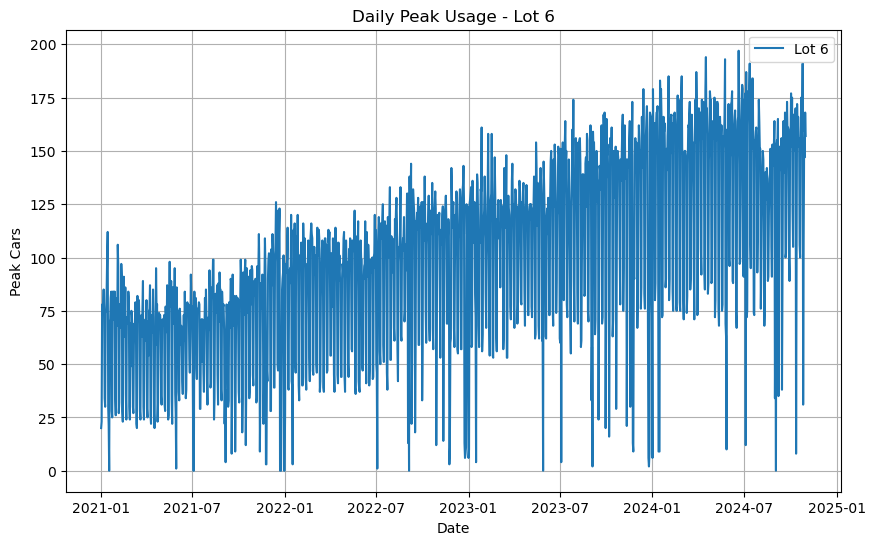

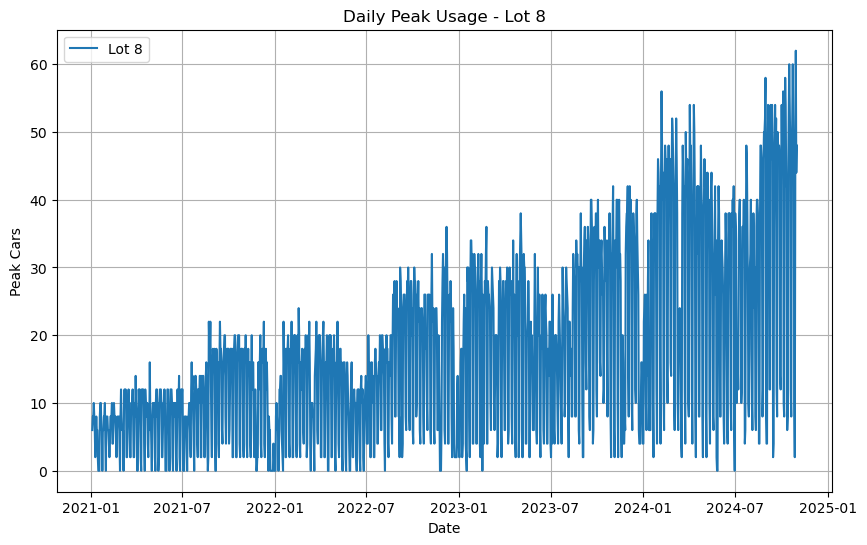

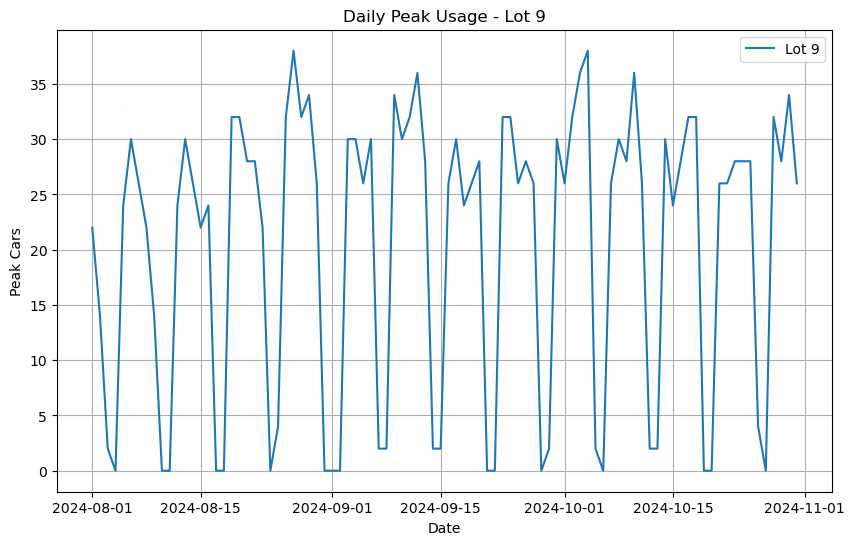

...

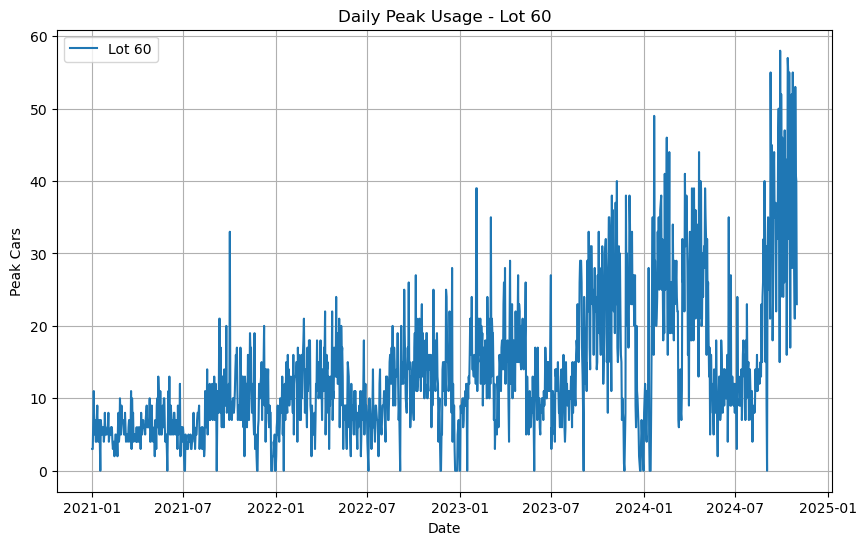

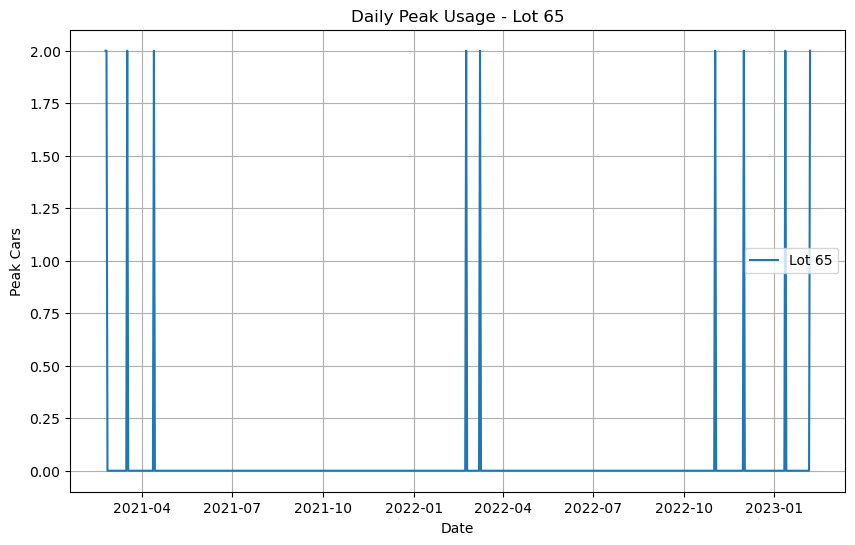

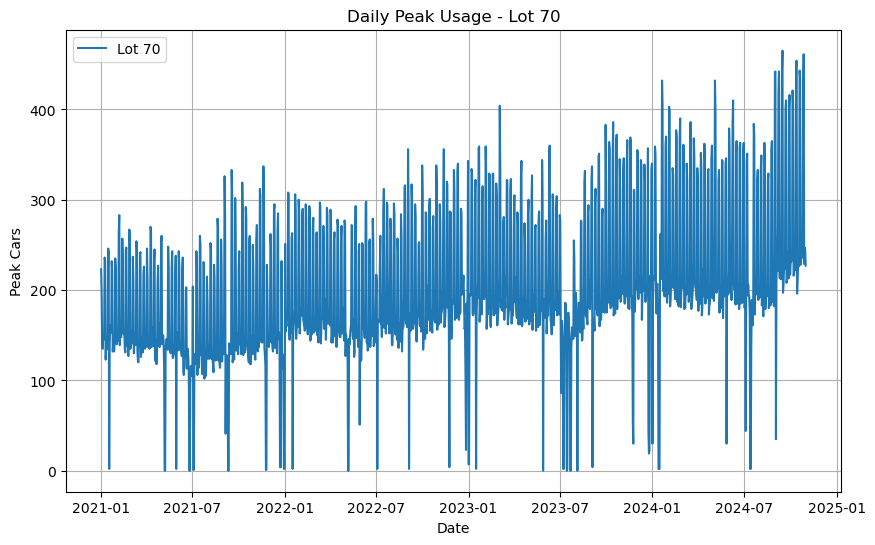

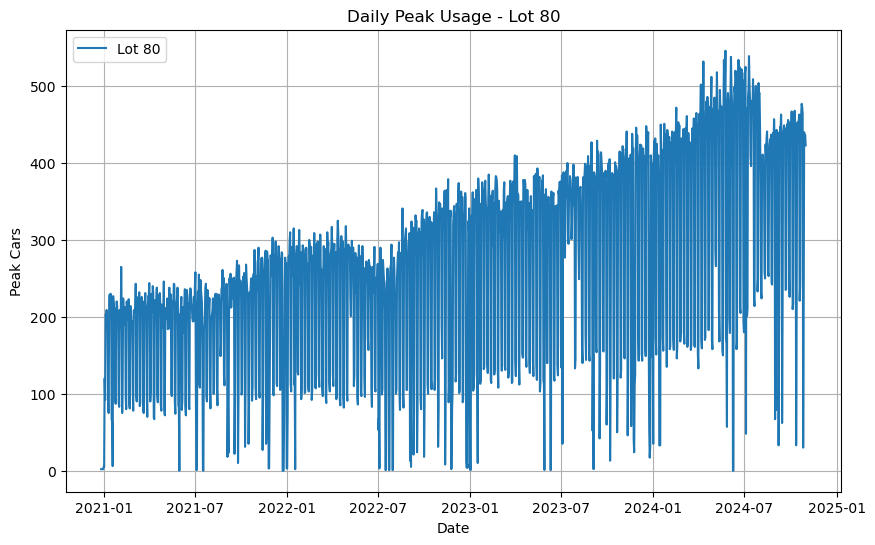

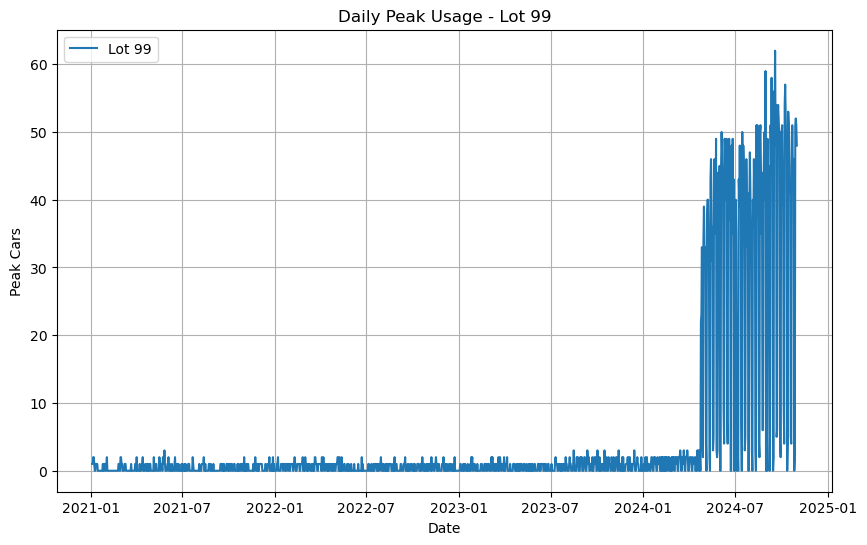

In [20]:
for lot in daily_peak_df['LotNumber'].unique():
    lot_data = daily_peak_df[daily_peak_df['LotNumber'] == lot]
    
    plt.figure(figsize=(10, 6))
    plt.plot(lot_data['Date'], lot_data['DailyPeak'], label=f"Lot {lot}")
    plt.title(f"Daily Peak Usage - Lot {lot}")
    plt.xlabel("Date")
    plt.ylabel("Peak Cars")
    plt.grid()
    plt.legend()
    plt.show()


In [21]:
# Ensure Date is in datetime format
hourly_usage_df['Date'] = pd.to_datetime(hourly_usage_df['Date'])  

# Create the Dash app
app = Dash(__name__)

# App layout
app.layout = html.Div([
    html.H1("Interactive Hourly Usage Visualization", style={'text-align': 'center'}),

    # Dropdown for selecting lot
    html.Div([
        html.Label("Select Lot:"),
        dcc.Dropdown(
            id='lot-dropdown',
            options=[{'label': f"Lot {lot}", 'value': lot} for lot in hourly_usage_df['LotNumber'].unique()],
            value=hourly_usage_df['LotNumber'].unique()[0],  # Default to the first lot
            clearable=False
        )
    ], style={'width': '30%', 'margin': '0 auto'}),

    # Date range picker
    html.Div([
        html.Label("Select Date Range:"),
        dcc.DatePickerRange(
            id='date-picker-range',
            start_date=hourly_usage_df['Date'].min().date(),
            end_date=hourly_usage_df['Date'].max().date(),
            min_date_allowed=hourly_usage_df['Date'].min().date(),
            max_date_allowed=hourly_usage_df['Date'].max().date(),
            display_format='YYYY-MM-DD'
        )
    ], style={'width': '50%', 'margin': '20px auto'}),

    # Graph for the visualization
    dcc.Graph(id='hourly-usage-graph')
])

# Callback to update the graph based on selected lot and date range
@app.callback(
    Output('hourly-usage-graph', 'figure'),
    [
        Input('lot-dropdown', 'value'),
        Input('date-picker-range', 'start_date'),
        Input('date-picker-range', 'end_date')
    ]
)
def update_graph(selected_lot, start_date, end_date):
    # Filter data for the selected lot and date range
    filtered_data = hourly_usage_df[
        (hourly_usage_df['LotNumber'] == selected_lot) &
        (hourly_usage_df['Date'] >= pd.to_datetime(start_date)) &
        (hourly_usage_df['Date'] <= pd.to_datetime(end_date))
    ]

    if filtered_data.empty:
        # Handle empty data case
        fig = px.line(title="No data available for the selected filters.")
        return fig

    # Create the line chart
    fig = px.line(
        filtered_data,
        x='Hour',
        y='ActiveCars',
        color='Date',
        title=f"Hourly Usage Line Chart - Lot {selected_lot}",
        labels={'Hour': 'Hour of Day', 'ActiveCars': 'Number of Active Cars'},
    )
    
    fig.update_layout(
        xaxis_title="Hour of Day",
        yaxis_title="Number of Active Cars",
        hovermode="x unified",
        template="plotly_white"
    )
    return fig

# Run the Dash app
if __name__ == '__main__':
    app.run_server(debug=True, port= 3001)


In [65]:

required_columns = ['LotNumber', 'EntranceTime', 'ExitTime']
for col in required_columns:
    if col not in card_transaction_df.columns:
        raise KeyError(f"Missing required column: {col}")

# Convert 'EntranceTime' and 'ExitTime' to datetime if not already
card_transaction_df['EntranceTime'] = pd.to_datetime(card_transaction_df['EntranceTime'], errors='coerce')
card_transaction_df['ExitTime'] = pd.to_datetime(card_transaction_df['ExitTime'], errors='coerce')

# Extract the Date column for grouping
card_transaction_df['Date'] = card_transaction_df['EntranceTime'].dt.date

# Calculate daily peak usage per LotNumber
daily_peak_df = (
    card_transaction_df
    .groupby(['LotNumber', 'Date'])
    .size()
    .reset_index(name='DailyPeak')  # 'size()' gives the count of active cars for each day
)

# Ensure 'Date' is in datetime format
daily_peak_df['Date'] = pd.to_datetime(daily_peak_df['Date'])

# Step 2: Define the forecasting function using SARIMA
def forecast_peak_usage(data, lot_number, forecast_period=60):
    """
    Forecast daily peak usage using SARIMA model.
    
    Args:
        data (pd.DataFrame): DataFrame with columns ['Date', 'DailyPeak'].
        lot_number (int): Lot number for filtering data.
        forecast_period (int): Number of days to forecast.

    Returns:
        pd.DataFrame: DataFrame with observed and predicted values.
    """
    lot_data = data[data['LotNumber'] == lot_number].set_index('Date')
    lot_data = lot_data.resample('D').mean().fillna(0)  # Resample and fill missing days with 0

    # Train-test split
    train_data = lot_data.loc[:'2024-10-31']
    forecast_start_date = pd.to_datetime("2024-11-01")
    forecast_end_date = pd.to_datetime("2024-12-31")
    test_data = lot_data.loc[forecast_start_date:forecast_end_date]

    # SARIMA model
    sarima_model = SARIMAX(train_data['DailyPeak'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
    sarima_fit = sarima_model.fit(disp=False)

    # Explicitly define forecast start and end indices
    forecast_index = pd.date_range(start=forecast_start_date, end=forecast_end_date, freq='D')
    sarima_forecast = sarima_fit.get_prediction(start=len(train_data), end=len(train_data) + len(forecast_index) - 1).predicted_mean
    sarima_forecast.index = forecast_index  # Align with test data index

    # Combine results
    results = pd.DataFrame({
        'Date': forecast_index,
        'Observed': test_data['DailyPeak'].reindex(forecast_index, fill_value=np.nan).values,
        'SARIMA_Predicted': sarima_forecast.values
    })

    # Add historical observed data
    historical_data = train_data.reset_index()[['Date', 'DailyPeak']].rename(columns={'DailyPeak': 'Observed'})
    results = pd.concat([historical_data, results], ignore_index=True)

    return results

# Step 3: Forecast for each lot
forecast_results = {}
for lot in daily_peak_df['LotNumber'].unique():
    try:
        forecast_results[lot] = forecast_peak_usage(daily_peak_df, lot)
    except ValueError as e:
        print(f"Skipping Lot {lot} due to error: {e}")

# Step 4: Interactive Dashboard
app = Dash(__name__)

app.layout = html.Div([
    html.H1("Parking Lot Peak Usage Forecast"),
    html.Div([
        html.Label("Select Lot:"),
        dcc.Dropdown(
            id='lot-dropdown',
            options=[{'label': f'Lot {lot}', 'value': lot} for lot in forecast_results.keys()],
            value=list(forecast_results.keys())[0],
            clearable=False
        )
    ]),
    html.Div([
        html.Label("Select View:"),
        dcc.RadioItems(
            id='view-dropdown',
            options=[
                {'label': 'Daily View', 'value': 'daily'},
                {'label': 'Weekly View', 'value': 'weekly'}
            ],
            value='daily',
            inline=True
        )
    ]),
    dcc.Graph(id='forecast-graph')
])

@app.callback(
    Output('forecast-graph', 'figure'),
    [Input('lot-dropdown', 'value'), Input('view-dropdown', 'value')]
)
def update_graph(selected_lot, view_type):
    df = forecast_results[selected_lot]
    
    if view_type == 'weekly':
        df['Week'] = df['Date'].dt.to_period('W').apply(lambda x: x.start_time)
        weekly_df = df.groupby('Week').mean().reset_index()
        fig = px.line(
            weekly_df,
            x='Week',
            y=['Observed', 'SARIMA_Predicted'],
            title=f'Weekly Forecast for Lot {selected_lot}',
            labels={'value': 'Peak Cars', 'variable': 'Type'}
        )
    else:  # Default to daily view
        fig = px.line(
            df,
            x='Date',
            y=['Observed', 'SARIMA_Predicted'],
            title=f'Daily Forecast for Lot {selected_lot}',
            labels={'value': 'Peak Cars', 'variable': 'Type'}
        )
    return fig

# Run the app
if __name__ == "__main__":
    app.run_server(debug=False, port=8001)
